<a href="https://colab.research.google.com/github/jyhyun1008/mikantone/blob/main/MIKANTONE_Midi2Audio(Vocal_Editor).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MIKANTONE

This is the **vocal editor** file of MIKANTONE. If you want to make a model, try [this link](https://colab.research.google.com/drive/1CSkdUcguLbGpXc3ktMb3qt2yIRWIGmwS?usp=sharing).

본 파일은 미캉톤의 **보컬 에디터** 입니다. 모델을 만드시고 싶다면 [이 링크](https://colab.research.google.com/drive/1CSkdUcguLbGpXc3ktMb3qt2yIRWIGmwS?usp=sharing)를 방문해 주세요.

In [1]:
#@title Mount Google Drive / 구글 드라이브 마운트 { display-mode: "form" }
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1. Load the Model and the Song / 모델과 노래 파일 불러오기

In [2]:
#@title Copy Your Model / 구글 드라이브에서 모델 로드

!mkdir -p "model"

#@markdown **We assume that your model is in your Google Drive's `mikantone/models/(speaker_name)` directory.**

#@markdown **구글 드라이브 내 `mikantone/models/(speaker_name)` 디렉토리에 있는 모델 파일을 불러옵니다.**
DatasetName = "LABCO" #@param {type: "string"}
!cp -R /content/drive/MyDrive/mikantone/models/{DatasetName}/ -t "model/"

In [7]:
#@title Copy Your MusicXML File / 구글 드라이브에서 MusicXML 파일 로드

!mkdir -p "songs"

#@markdown **We assume that your .musicxml file is in your Google Drive's `mikantone/songs/` directory.**

#@markdown **구글 드라이브 내 `mikantone/songs/` 디렉토리에 .musicxml 파일을 저장해주세요.**
musicXmlFileName = "doublelariat" #@param {type: "string"}
!cp -R /content/drive/MyDrive/mikantone/songs/ -t "songs/"



# 2. Import Modules, Arrays, Functions, ... / 필요한 모듈 임포트, 함수 정의, 모델 불러오기

In [4]:
# python 표준 라이브러리
import os

# 오픈소스 라이브러리
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import tensorflow as tf
import numpy as np
import librosa
from scipy.io.wavfile import write

# Colab Notebook Library
import IPython.display as ipd

In [5]:
num = {'' : [0, 0, 0], ' ' : [0, 0, 0], 'a': [1, 0.7, 0.7], 'e': [1, 1, 0.7], 'i': [0.7, 1, 0.7], 'o': [0.7, 1, 1], 'u': [0.7, 0.7, 1],
       'w': [0.7, 0.7, 1], 'y':[0.7, 1, 0.7], 'h': [0.7, 0.7, 0.7], 'f': [0.7, 0.7, 0.7],
       'r': [1, 0.4, 0.4], 'n': [0.4, 1, 0.4], 'N': [0.5, 1, 0.5], 'm': [0.4, 0.4, 1],
            'g': [0.4, 0, 0], 'd': [0, 0.4, 0], 'b': [0, 0, 0.4],
            'k': [0.2, 0, 0], 't': [0, 0.2, 0], 'T': [0, 0.1, 0], 'p': [0, 0, 0.2],
            's': [0.7, 0.4, 0.4], 'sh': [0.7, 0.4, 0.4], 'ch': [0.4, 0.7, 0.4], 'ts': [0.4, 0.7, 0.4], 'z': [0.4, 0.4, 0.7], 'j': [0.4, 0.4, 0.7]}

freqArray = np.multiply([97, 104, 110, 117, 123, 131, 139, 147, 156, 165, 175, 185, 196, 208, 220, 233, 247, 262, 277, 294, 311, 330, 349, 370, 392, 415, 440, 0], 1/5.55)
pitchDict = {'<step>G</step><octave>3</octave>': -2,
              '<step>G</step><alter>1</alter><octave>3</octave>': -1,
              '<step>A</step><octave>3</octave>': 0,
              '<step>A</step><alter>1</alter><octave>3</octave>': 1,
              '<step>B</step><octave>3</octave>': 2,
              '<step>C</step><octave>4</octave>': 3,
              '<step>C</step><alter>1</alter><octave>4</octave>': 4,
              '<step>D</step><octave>4</octave>': 5,
              '<step>D</step><alter>1</alter><octave>4</octave>': 6,
              '<step>E</step><octave>4</octave>': 7,
              '<step>F</step><octave>4</octave>': 8,
              '<step>F</step><alter>1</alter><octave>4</octave>': 9,
              '<step>G</step><octave>4</octave>': 10,
              '<step>G</step><alter>1</alter><octave>4</octave>': 11,
              '<step>A</step><octave>4</octave>': 12,
              '<step>A</step><alter>1</alter><octave>4</octave>': 13,
              '<step>B</step><octave>4</octave>': 14,
              '<step>C</step><octave>5</octave>': 15,
              '<step>C</step><alter>1</alter><octave>5</octave>': 16,
              '<step>D</step><octave>5</octave>': 17,
              '<step>D</step><alter>1</alter><octave>5</octave>': 18,
              '<step>E</step><octave>5</octave>': 19,
              '<step>F</step><octave>5</octave>': 20,
              '<step>F</step><alter>1</alter><octave>5</octave>': 21,
              '<step>G</step><octave>5</octave>': 22,
              '<step>G</step><alter>1</alter><octave>5</octave>': 23,
              '<step>A</step><octave>5</octave>': 24}

freqArray = freqArray.astype(int)
freqOneHot = tf.one_hot(freqArray, 1000)
for i in range(30):
  freqOneHot = tf.math.add(freqOneHot, tf.one_hot(np.multiply(freqArray, i+2), 1000, on_value=0.8))
  freqOneHot = tf.math.add(freqOneHot, tf.one_hot([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 600+10*i], 1000))
freqOneHot = tf.clip_by_value(freqOneHot, 0, 1)
freqOneHot_1 = tf.roll(freqOneHot, 1, 1)
freqOneHot_2 = tf.roll(freqOneHot, -1, 1)
freqOneHot = tf.math.add(freqOneHot, freqOneHot_1)
freqOneHot = tf.math.add(freqOneHot, freqOneHot_2)
#freqOneHot = np.multiply(freqOneHot, 1)

In [8]:
musicXml = open('songs/songs/'+musicXmlFileName+'.musicxml', 'r')
notesOrigin = str(musicXml.read().replace('\n', '').replace('    ', '')).split('<note>')
divisions = eval(notesOrigin[0].split('<divisions>')[1].split('</divisions>')[0])
tempo = eval(notesOrigin[0].split('tempo="')[1].split('"')[0])

notesArray = [] # 시간, 음높이, 음소
time = 0

for i in range(0, len(notesOrigin)):
  string = notesOrigin[i].split('</note>')[0]
  if 'duration' in string:
    pitch = 0
    syl = ''
    if 'pitch' in string:
      pitch = pitchDict[string.split('<pitch>')[1].split('</pitch>')[0]]
      if '/text' in string:
        syl = string.split('<text>')[1].split('<')[0]
    #notesArray.append(string)
    notesArray.append([time, pitch, syl])
    time = time + eval(string.split('<duration>')[1].split('</duration>')[0])*1800/divisions/tempo

notesArray.append([time, 0, ''])

def parseLyrics(lyrics):
  expand_lyrics = []
  for j in range(len(lyrics)):
    if j > 0:
      if lyrics[j-1]+lyrics[j] == 'ch':
        expand_lyrics.remove('c')
        expand_lyrics.append('ch')
      elif lyrics[j-1]+lyrics[j] == 'ts':
        expand_lyrics.remove('t')
        expand_lyrics.append('ts')
      elif lyrics[j-1]+lyrics[j] == 'sh':
        expand_lyrics.remove('s')
        expand_lyrics.append('sh')
      else:
        expand_lyrics.append(lyrics[j])
    else:
      expand_lyrics.append(lyrics[j])
  return expand_lyrics

result = []
for i in range(len(notesArray)):
  if i < len(notesArray) - 1:
    time = notesArray[i+1][0] - notesArray[i][0]
    timeArr = []
    timeC = 0
    timeV = 0
    syl = parseLyrics(notesArray[i][2])
    if len(syl) > 0:
      for j in range(len(syl)):
        if syl[j] in 'aeiouNT':
          timeV += 1
        elif syl[j] in 'wy':
          timeC += 1
      if timeV > 0:
        lenV = (time - timeC*1)/timeV
      else :
        lenV = time
      for j in range(len(syl)):
        if j > 0:
          if syl[j-1] in 'aeiouNT':
            timeArr.append(timeArr[-1]+lenV)
          elif syl[j-1] in 'wy':
            timeArr.append(timeArr[-1] + 1)
          elif syl[j-1] in 'rktp' or syl[j-1] == 'ch' or syl[j-1] == 'ts':
            timeArr[-1] = timeArr[-1] - 1
            timeArr.append(timeArr[-1] + 1)
          else:
            timeArr[-1] = timeArr[-1] - 2
            timeArr.append(timeArr[-1] + 2)
        else:
          timeArr.append(0)
      for j in range(len(syl)):
        result.append([notesArray[i][0]+timeArr[j], notesArray[i][1], syl[j]])
      if i == 1:
        print(timeArr)
    else:
      result.append(notesArray[i])
  else:
    result.append(notesArray[i])

for i in range(len(result)):
  if result[i][2] == 'ch':
    result[i][1] = 25
  elif result[i][2] == 'ts':
    result[i][1] = 25
  elif result[i][2] == 'sh':
    result[i][1] = 25
  elif result[i][2] in 'zjs':
    result[i][1] = 25

lyrics = result

[-2, 0]


In [9]:
# Recreate the exact same model, including its weights and the optimizer
generator = tf.keras.models.load_model('model/'+DatasetName+'/saved_model/MIKANTONE_Library_'+DatasetName+'.h5')

# 3. Conversion to the Input Data / 입력 데이터로 변환

In [10]:
inputData = []
for o in range(3):
    inputData.append([])
    l = 0
    for k in range(int(lyrics[-1][0]/150+1)*150):
      if l < len(lyrics)-1:
        if k >= lyrics[l+1][0]:
          l += 1
      inputData[o].append([np.multiply(freqOneHot[lyrics[l][1]+2],(num[lyrics[l][2]][o]))])

In [11]:
inputTensor = []
inputTemp = tf.transpose(tf.squeeze(tf.cast(inputData, tf.float32), 2))
for i in range(int(lyrics[-1][0]/150+1)):
  inputTensor.append(tf.image.resize(inputTemp[:, i*150:(i+1)*150], [512, 512],  antialias=True))
inputTensor = tf.cast(inputTensor, tf.float32)

# 4. Result / 결과

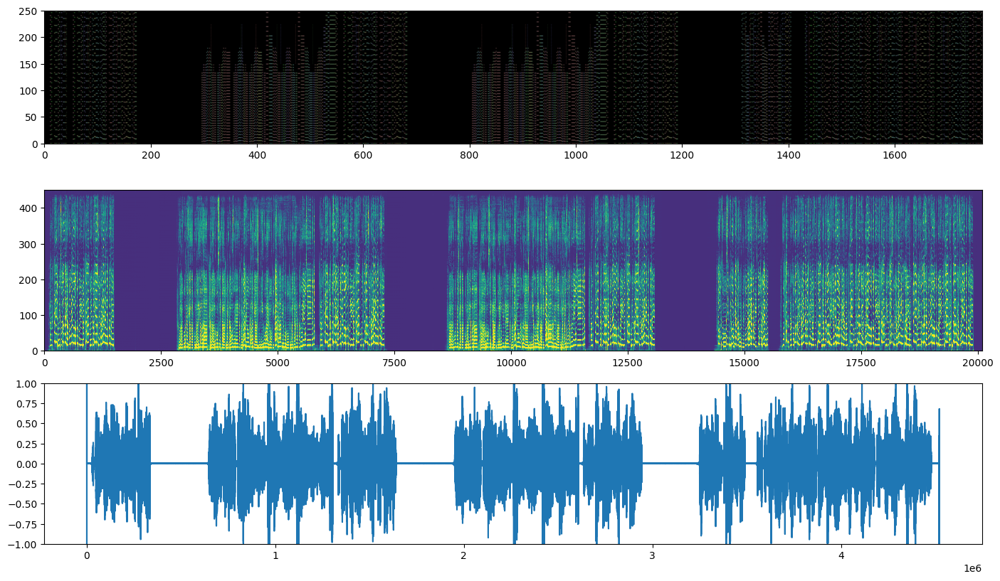

In [12]:
#@title Result #1: STFT Graph and Waveform Graph / STFT 및 파형 그래프 표시 { display-mode: "form" }

prediction = generator(tf.expand_dims(inputTensor[0], 0), training=True)[0]
prediction = tf.math.pow(10, 2.5*prediction - 1) * 5
prediction = tf.image.resize(prediction, [451, 490], antialias=False).numpy()
inputImg = inputTensor[0]

for i in range(len(inputTensor)-1):
  prediction_temp = generator(tf.expand_dims(inputTensor[i+1], 0), training=True)[0]
  prediction_temp = tf.math.pow(10, 2.5*prediction_temp - 1) * 5
  prediction_temp = tf.image.resize(prediction_temp, [451, 490], antialias=False).numpy()
  prediction = np.concatenate([prediction, prediction_temp], 1)
  inputImg = np.concatenate([inputImg, inputTensor[i]], 1)

#prediction[prediction < 0.005] = 0.001
#prediction[260:] = prediction[260:]*10
result = librosa.griffinlim(np.abs(prediction[:, :, 0]), n_fft=900, center=False)*3

plt.figure(figsize=(17, 10))

plt.subplot(3, 1, 1)
r1 = tf.image.resize(inputImg, [251, 1765], antialias=True)
plt.imshow(r1, origin='lower')

plt.subplot(3, 1, 2)
r1 = prediction[:, :, 0]
plt.pcolormesh(r1, norm=colors.LogNorm(vmin=0.001, vmax=1))

plt.subplot(3, 1, 3)
plt.ylim(-1, 1)
plt.plot(result)

In [13]:
#@title Result #2: Wave File / 음성 파일

ResultFileName = "doublelariat" #@param {type: "string"}

rate = 22050
!mkdir -p /content/drive/MyDrive/mikantone/result/{DatasetName}/
write('drive/MyDrive/mikantone/result/'+DatasetName+'/'+ResultFileName+'.wav', rate, result[10:-10])
ipd.Audio(result[10: -10], rate=rate)